# Exercise 2: Adding age structure to the model

In [25]:
# Loadind the data for age groups in Pavia
# The column "Percentage" display the ratio between "Total" (i.e. the total number of
# individual in the age ranges for city of Pavia) and the number of initial susceptibles
# provided in the introduction to the Assignment 1.

pavia = pd.read_excel('PV.xlsx', engine = 'openpyxl').drop(16)
pavia

,Age group,Total,Percentage
0,0-4 years,19417,0.035932
1,5-9 years,22181,0.041047
2,10-14 years,23929,0.044282
3,15-19 years,23247,0.043020
4,20-24 years,24269,0.044911
5,25-29 years,26296,0.048662
6,30-34 years,28573,0.052876
7,35-39 years,31469,0.058235
8,40-44 years,38582,0.071398
9,45-49 years,44508,0.082365


In [27]:
# Preparing the variables for the calibration

t0 = np.arange(0, db.loc['PV','Train days']+1, 1) 

# Proportion of age groups in the population
n = np.array(pavia['Percentage']) 

# Initial population
N = int(db.loc['PV','S0'])

S_0 = list(N * n) # Number of initial susceptibles * proportion of individuals in the age groups
S_0[11] -= 1 # Removing one susceptible individual from group 11

I_0 = [0]*16 
I_0[11] = 1 # One infected arbitrarily assigned to age group 11 (55-59 years)

R_0 = [0]*16 #Initial numer of recovered: 0 for each age group

INPUT0 = np.hstack((S_0, I_0, R_0))

# From the calibration of first exercise:
gamma_PV = 1/9
R0 = 2.7

# Parameters 
ro = float(np.max(la.eigvals(C.values)).real) # Spectral radius of matrix C
q = gamma_PV*R0/ro
BETA0 = q *C.values 

# The model: SIR
       
Individuals can be part of one of the following compartments:

1. Susceptibles ($S$) 
<br>
3. Infected ($I$) 
<br>
4. Recovered ($R$)


System of differential equations :

\begin{equation}
\frac{\partial S_{i}}{\partial t} = - \sum_j{\beta_{ij}\frac{I_j}{N_j}S_i} \\
\frac{\partial I_{i}}{\partial t} = \sum_j{\beta_{ij}\frac{I_j}{N_j}S_i} - \gamma I_i \\
\frac{\partial R_{i}}{\partial t} = \gamma I_i \\
\end{equation}

j = 0,..,16 $\rightarrow$  age group index

**Parameters:**
* $\frac{I_j}{N_j}$ : proportion of infected for age group j
* $\beta$: WAIFW matrix $\rightarrow$ $\beta = q * C$
    * $q$ = intrinsic probablity of transmission
    * $C$ = contact matrix
* $\gamma$ is the recovery rate :  $\gamma =  \frac{1}{\text{avg duration of infectious period}} $ 

In [28]:
# Definition of the SIR model

def SIR(INPUT, t, BETA, gamma):
    k = 16
    S, I, R = INPUT[:16], INPUT[16:32], INPUT[32:]
    Y = np.zeros((48)) 
    
    for i in range(k): 
        SUM = np.dot(BETA[i], I/(N*n)) * S[i]
        Y[i] = (-1)* SUM
        Y[(k+i)] = SUM - gamma * I[i]
        Y[(2*k+i)] = gamma * I[i]

    return Y

In [29]:
# Definition of the function for the plots of the SIR results

def plot_SIR(S, I, R, t):
    colors = ['r','tab:orange','lightcoral','b','c','m','gold','peachpuff','tab:pink','mediumorchid',
          'darkmagenta','deeppink','dodgerblue','steelblue','darkturquoise','seagreen']
    
    print('Time range: days {} - {}'.format(t[0],t[-1]))
    
    fig, axs = plt.subplots(nrows=1, ncols=3, facecolor='w', figsize=(9,3))
    
    axs[0].set_title('Susceptibles')
    for i in range(16):
        axs[0].plot(t, S[i], colors[i], alpha=0.6, lw=2)
    axs[0].set_xlabel('Time')
    axs[0].set_ylabel('S')
    
    axs[1].set_title('Infected')
    for i in range(16):
        axs[1].plot(t, I[i], colors[i], alpha=0.6, lw=2)
    axs[1].set_xlabel('Time')
    axs[1].set_ylabel('I')

    axs[2].set_title('Recovered')
    for i in range(16):
        axs[2].plot(t, R[i], colors[i], alpha=0.6, lw=2)
    axs[2].set_xlabel('Time')
    axs[2].set_ylabel('R')

    axs[2].legend(loc="upper right", fontsize=9, frameon=False) # upper left corner
    fig.tight_layout()
    for aa in range(3):
        ax = axs[aa]
        for spine in ('top', 'right'): 
            ax.spines[spine].set_visible(False)
    plt.legend(pavia['Age group'], bbox_to_anchor=(1.05, 1), loc='upper left')

## Calibration of R0

In [34]:
# Definition of the calibration function for the SIR model

def calibrate_model(R0s, INPUT, time):

    MSEs = []  
    I_hats = [] 
    qs = []

    for R0 in R0s:
        q = R0 * gamma_PV / ro
        BETA = q * C.values
        qs.append(q)

        RES = odeint(SIR, INPUT ,time, args = (BETA, gamma_PV))
        S, I_hat, R = RES.T[:16], RES.T[16:32], RES.T[32:]

        I_daily = (I_hat.sum(axis = 0)[1:] + R.sum(axis = 0)[1:]) - (I_hat.sum(axis = 0)[:-1] + R.sum(axis = 0)[:-1])
        I_hats.append(I_daily)
        true_data = provinces['PV'][time[0]: time[-1]]

        MSE = np.sqrt(sum((I_daily - true_data)**2)/len(true_data))
        MSEs.append(MSE)
        
    cal = pd.DataFrame({'R0': R0s, 'q': qs, 'MSE': MSEs, 'I_hat': I_hats})   
    best_param = cal[cal['MSE'] == np.min(cal['MSE'])]

    return cal, best_param

In [35]:
# Run the calibration

R0s = np.arange(1,3,0.001)
res_cal, best_param = calibrate_model(R0s, INPUT0, t0)
best_param[['R0','q','MSE']] # optimal parameters

,R0,q,MSE
909,1.909,0.010151,5.796792


### Calibrated model

In [36]:
R0_new = 1.909 # Set the optimal R0 
q_new = round(gamma_PV*R0_new/ro, 5)
BETA_new = q_new *C.values

# Run the SIR model with the calibrated parameters
RES_new = odeint(SIR, INPUT0, t0, args = (BETA_new, gamma_PV))
S_new, I_new, R_new = RES_new.T[:16], RES_new.T[16:32], RES_new.T[32:]

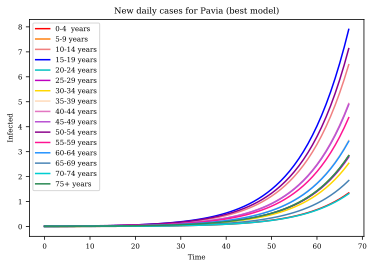

In [37]:
#Plot the results of the SIR:

colors = ['r','tab:orange','lightcoral','b','c','m','gold','peachpuff','tab:pink','mediumorchid',
          'darkmagenta','deeppink','dodgerblue','steelblue','darkturquoise','seagreen']

I_daily_PV = (I_new[:,1:] + R_new[:,1:]) - (I_new[:,:-1] + R_new[:,:-1])    

for i in range(16): 
    plt.plot(t0[:-1], I_daily_PV[i], c = colors[i])
    
plt.title('New daily cases for Pavia (best model)')
plt.xlabel('Time')
plt.ylabel('Infected')
plt.legend(pavia['Age group'])
plt.show()

Time range: days 0 - 68


No handles with labels found to put in legend.


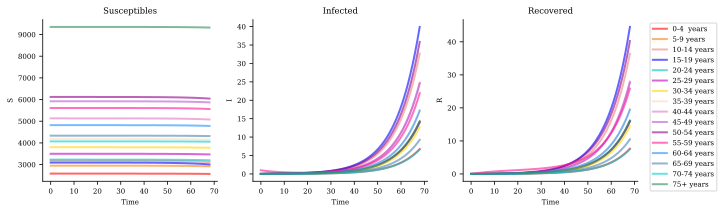

In [38]:
# Plot of the results of the SIR model between day 0 and 68:
plot_SIR(S_new, I_new, R_new, t0)

No handles with labels found to put in legend.


Time range: days 0 - 120


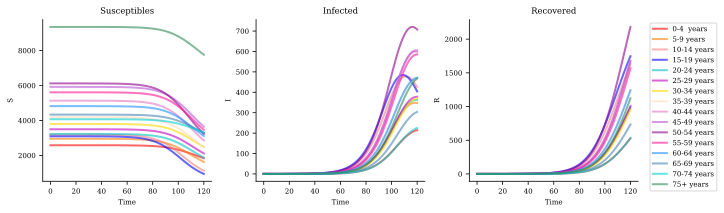

In [39]:
# Extension of the plot up to time 120, to be able to see 
# how the model predicts the infection dynamics after the
# train time

t_extend = np.arange(0,121,1)
RES_extend = odeint(SIR, INPUT0, t_extend, args = (BETA_new, gamma_PV))
S_e, I_e, R_e = RES_extend.T[:16], RES_extend.T[16:32], RES_extend.T[32:]
plot_SIR(S_e, I_e, R_e, t_extend)

## Which are the groups that are infected the most?

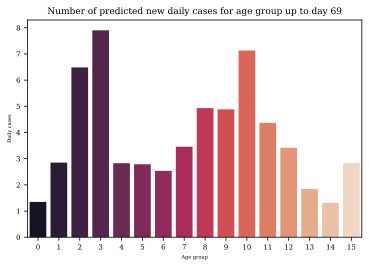

In [40]:
# Calculate the highest number of daily infecteds reached by each age group

peaks = []
New_cases = (I_new[:,1:] + R_new[:,1:]) - (I_new[:,:-1] + R_new[:,:-1]) #daily cases for each age group

for i in range(16): # For each age group
    l = New_cases[i]
    idx = l.argmax() # Index of the peak
    peaks.append(l[idx])

sns.barplot(np.arange(0,16,1), peaks, palette = 'rocket')
plt.title('Number of predicted new daily cases for age group up to day 69', fontsize = 9)
plt.xlabel('Age group', fontsize = 5)
plt.ylabel('Daily cases', fontsize = 5)
plt.show()

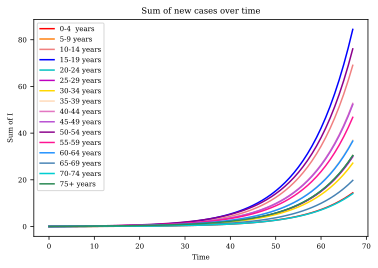

In [41]:
# Cumulative sum of new daily cases

fig, ax = plt.subplots()
ax.set_title('Sum of new cases over time')

cum = [np.cumsum(New_cases[i]) for i in range(16)]
for i in range(len(cum)):
    ax.plot(cum[i], c = colors[i])

ax.set_xlabel('Time')
ax.set_ylabel('Sum of I')
ax.legend(pavia['Age group'])
plt.show()

In [42]:
tot_infected = New_cases.sum(axis = 1)
print("The group with the highest total absolute number of infected is:",
      pavia.loc[np.argmax(tot_infected),'Age group'])

The group with the highest total absolute number of infected is: 15-19 years


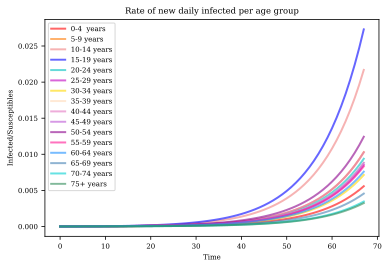

In [43]:
# Plot of the rate of infected

fig, ax = plt.subplots()
ax.set_title('Rate of new daily infected per age group')
rates = {}
highest_rates = []

for i in range(16):
    rates[i] = cum[i]/S_0[i]
    highest_rates.append(rates[i][-1])
    ax.plot(t0[:-1], rates[i], colors[i], alpha=0.6, lw=2)

ax.set_xlabel('Time')
ax.set_ylabel('Infected/Susceptibles')
ax.legend(pavia['Age group'])
plt.show()

When the first infected berson is aged between 55-59 years:

In [44]:
ag = np.array(highest_rates).argsort()[-3:][::-1]
print("Most infected groups:\n",pavia['Age group'].loc[list(ag)].values)

Most infected groups:
 ['15-19 years' '10-14 years' '50-54 years']


In [45]:
print("The group with the highest rate of infected is:", pavia.loc[np.argmax(highest_rates),'Age group'])

The group with the highest rate of infected is: 15-19 years


Does the most infected group change by changing the age of the first infected case that started the spreading of the virus?

In [43]:
# Calculating how the most infected group changes by changing
# the starting group of the infection
  # -- the following code takes some minutes to run --
    
most_inf = []

for i in range(16): 
    s_0 = list(N * n) 
    s_0[i] -= 1 
    i_0 = [0]*16 
    i_0[i] = 1  # start the infection from an individual belonging to group i

    Input = np.hstack((s_0, i_0, R_0))
    res_newinf, best_param_newinf = calibrate_model(R0s, Input, t0) # calibrate the model

    R0_newinf = best_param['R0']
    q_newinf = round(gamma_PV*R0_new/ro, 5)
    BETA_newinf = q_newinf *C.values

    # Run the SIR model with the newly calibrated parameters
    RES_2 = odeint(SIR, Input, t0, args = (BETA_newinf, gamma_PV))
    S_2, I_2, R_2 = RES_2.T[:16], RES_2.T[16:32], RES_2.T[32:]

    new_cases = (I_2[:,1:] + R_2[:,1:]) - (I_2[:,:-1] + R_2[:,:-1]) #daily cases for each age group
    cum = [np.cumsum(new_cases[i]) for i in range(16)]

    # Preparing containers for storing the results
    rates = {}
    highest_rates = []

    for i in range(16):
        rates[i] = cum[i]/S_0[i]
        highest_rates.append(rates[i][-1])

    most_inf.append(pavia.loc[np.argmax(highest_rates),'Age group'])

most_inf

['15-19 years',
 '15-19 years',
 '15-19 years',
 '15-19 years',
 '15-19 years',
 '15-19 years',
 '15-19 years',
 '15-19 years',
 '15-19 years',
 '15-19 years',
 '15-19 years',
 '15-19 years',
 '15-19 years',
 '15-19 years',
 '15-19 years',
 '15-19 years']

Irrespectively of the data group to which the first infectious individual belong, the most infected group will always be the 15-19 year class.

## Heatmap of the contact matrix

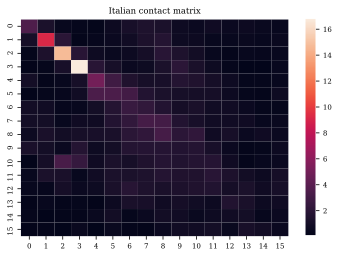

In [46]:
# Visual representation of the contact matrix

plt.title('Italian contact matrix')
sns.heatmap(C)
plt.show()

# Exercise 3: Improve the model

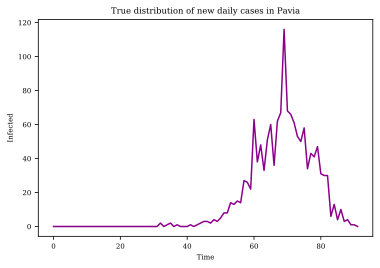

In [47]:
# Plot of the true data for the province of Pavia

plt.plot(provinces['PV'], color = 'darkmagenta')
plt.title('True distribution of new daily cases in Pavia')
plt.xlabel('Time')
plt.ylabel('Infected')
plt.show()

In [48]:
print('The highest peak of dalily infected in Pavia occurred at day {}: + {} infected'.format(np.argmax(provinces['PV']),max(provinces['PV'])))

The highest peak of dalily infected in Pavia occurred at day 69: + 116 infected


Two restrictive interventions will be implemented:
<br>
    1. Closure of schools at time 50;
<br>
    2. Compulsory quarantine for everyone at time 69.

In [49]:
# Definition of the time ranges between the interventions 

t_1period = np.arange(1, 55, 1)
t_2period = np.arange(55, 69, 1)
t_3period = np.arange(69, len(provinces['PV']) + 1, 1)

INPUT0 = np.hstack((S_0,I_0,R_0)) # start with initial values of the population
                                  # the first infected individual belongs to group 4,
                                  # i.e. is aged between 20-24 years

### Period 1: from day 0 to 54
<br>
No restrictions in this time range

No handles with labels found to put in legend.


Time range: days 1 - 54


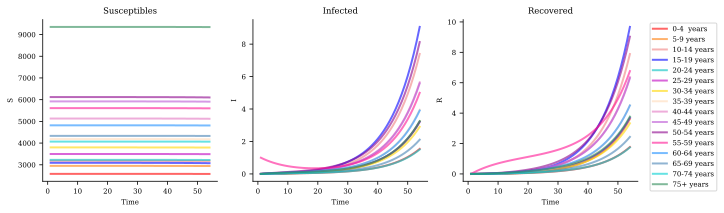

In [51]:
# Use the optimal parameters calibrated in the previous exercise to run the SIR
# for the first time period, i.e. the one with no restrictions

R0_1period  = 1.909
q_1period  = gamma_PV*R0_1period/ro
BETA_1period = q_1period*C.values

RES_1period = odeint(SIR, INPUT0, t_1period, args = (BETA_1period, gamma_PV))
S_1p, I_1p, R_1p = RES_1period.T[:16], RES_1period.T[16:32], RES_1period.T[32:]

plot_SIR(S_1p, I_1p, R_1p, t_1period)

### Period 2: from day 55 to 68
<br>
Closure of schools starting from day 55

In [52]:
# Store the last values calculated for the S, I and R groups,
# i.e. the values for the integrated equations at time 54

SSS = [i[53] for i in S_1p] 
III = [i[53] for i in I_1p]
RRR = [i[53] for i in R_1p]

INPUT2_per = np.hstack((SSS,III,RRR))

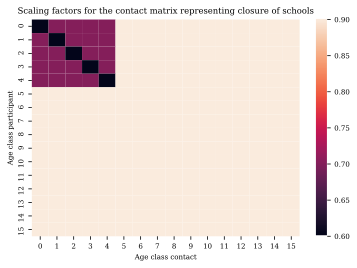

In [53]:
# Defining the mask to apply to the contact matrix
# to perform the reduction in contacts due to the closure of schools

school_mask = np.ones((16,16))*0.9 # Reduction in contacts with each age
school_mask[:5,:5] = 0.7 # Harsher reduction between young individuals
for i in range(5):
    school_mask[i,i] = 0.6 # The highest reduction is between people of the same age
    
# Visual representation of the scaling factors
plt.title('Scaling factors for the contact matrix representing closure of schools')
sns.heatmap(school_mask)
plt.xlabel('Age class contact')
plt.ylabel('Age class participant')
plt.show()

No handles with labels found to put in legend.


Time range: days 55 - 68


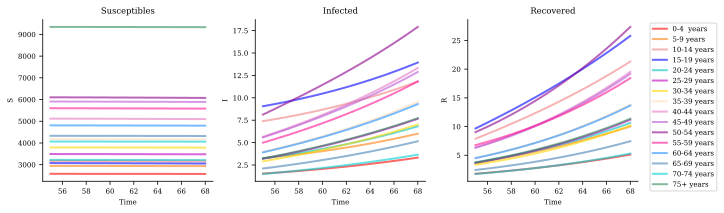

In [54]:
# Integrate the SIR equations over the second time interval,
# using the rescaled contact matrix, which is mathematically equivalent
# to multiplying BETA for the school_mask

BETA_2period = BETA_1period * school_mask
RES_2period = odeint(SIR, INPUT2_per, t_2period, args = (BETA_2period, gamma_PV))
S_2p, I_2p, R_2p = RES_2period.T[:16], RES_2period.T[16:32], RES_2period.T[32:]

plot_SIR(S_2p, I_2p, R_2p, t_2period)

### Period 3: from day 69 to 92
<br>
Introduction of compulsory quarantine from day 69

In [55]:
# Store the last values calculated for the S, I and R groups,
# i.e. the values for the integrated equations at time 68

SSS_3 = [i[13] for i in S_2p]
III_3 = [i[13] for i in I_2p]
RRR_3 = [i[13] for i in R_2p]

INPUT3_per = np.hstack((SSS_3,III_3,RRR_3))

No handles with labels found to put in legend.


Time range: days 69 - 92


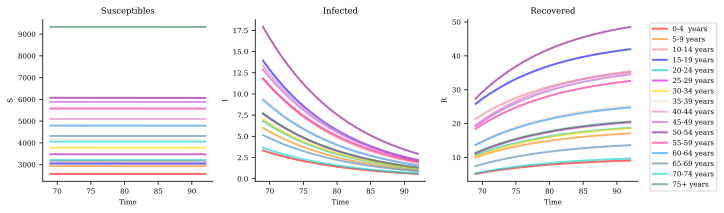

In [56]:
# Integrate the SIR equations over the third time interval,
# using the rescaled contact matrix, which is mathematically equivalent
# to multiplying BETA for a scaling factor representing quarantine.

scaling_factor_quar  = 0.2
BETA_3period = BETA_2period*scaling_factor_quar

RES_3period = odeint(SIR, INPUT3_per, t_3period, args = (BETA_3period, gamma_PV))
S_3p, I_3p, R_3p = RES_3period.T[:16], RES_3period.T[16:32], RES_3period.T[32:]

plot_SIR(S_3p, I_3p, R_3p, t_3period)

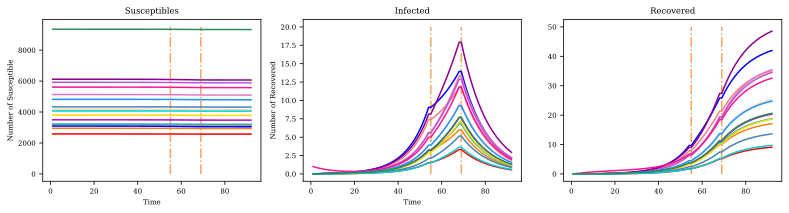

In [57]:
# Cumulative plot of the results obtained 

S_final_plot = np.hstack((S_1p, S_2p, S_3p))
I_final_plot = np.hstack((I_1p, I_2p, I_3p))
R_final_plot = np.hstack((R_1p, R_2p, R_3p))
t_final_plot = np.arange(1,93,1)

fig, axs = plt.subplots(1,3, figsize = (11,3))
axs[0].set_title('Susceptibles')
axs[0].vlines(55, 0, 9500, linestyles = 'dashdot', color = 'sandybrown')
axs[0].vlines(69, 0, 9500, linestyles = 'dashdot', color = 'sandybrown')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Number of Susceptible')

axs[1].set_title('Infected')
axs[1].vlines(55, 0, 20, linestyles = 'dashdot', color = 'sandybrown')
axs[1].vlines(69, 0, 20, linestyles = 'dashdot', color = 'sandybrown')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Number of Infected')

axs[2].set_title('Recovered')
axs[2].vlines(55, 0, 50, linestyles = 'dashdot', color = 'sandybrown')
axs[2].vlines(69, 0, 50, linestyles = 'dashdot', color = 'sandybrown')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Number of Recovered')

for i in range(16):
    axs[0].plot(t_final_plot,S_final_plot[i,:], color = colors[i])
    axs[1].plot(t_final_plot,I_final_plot[i,:], color = colors[i])
    axs[2].plot(t_final_plot,R_final_plot[i,:], color = colors[i])
    
plt.tight_layout()
plt.show()

## Stochasticity

Stochastic model of COVID-19 with restrictions:
<br>
            1. Closing schools from time 52
            <br>
            2. Quarantine from time 69

In [58]:
# Definition of an auxiliary function to compute the number of
# individuals transisiotning from a compartment (population_at_risk) to another

def computeTransitions(popoulation_at_risk, event_rate, time_step):
    p = event_rate * time_step
    n_of_events = np.random.binomial(popoulation_at_risk, p, 1)
    return(n_of_events)

In [59]:
# Definition of the stochastic version of the SIR model

def SIR_stoc(INPUT, BETA, B, ndays):
    S0, I0, R0 = INPUT[:16], INPUT[16:32], INPUT[32:]
    S = np.array([S0])
    I = np.array([I0])
    R = np.array([R0])
    
    time_step = 1 
    t = np.arange(0, ndays, time_step)
    
    for i in t: #day by day
        dS = []
        dI = []
        dR = []

        if i >= 52: # after the closure of schools
            BETA = B

        for j in range(16): #for each age group
            
            lambda_ = np.dot(BETA[j], I[-1]/(N*n))
            
            if i >= 69: #after the introduction of compulsory quarantine
                lambda_ *= 0.2
                    
            # new infections are possible iff S>0 and lamba>0  
            if (lambda_.real > 0) & (S[-1][j] > 0):
                new_infections = computeTransitions(S[-1][j], lambda_.real, time_step)[0]
            elif (lambda_.real <=0) | (S[-1][j] <= 0):
                new_infections = 0

            # new recoveries are possible only iff I>0
            if(I[-1][j] > 0):
                new_recoveries = computeTransitions(I[-1][j], gamma, time_step)[0]
            else:
                new_recoveries = 0

            # New infections must not exceed available susceptibles
            if(new_infections > S[-1][j]):
                new_infections = S[-1][j]

            # New recoveries must not exceed available infecteds
            if(new_recoveries > I[-1][j]):
                new_recoveries = I[-1][j]
                
            dS.append(new_infections)
            dI.append(new_infections - new_recoveries)
            dR.append(new_recoveries)
                        
        new_arr_S = S[-1] - np.array(dS)   
        new_arr_I = I[-1] + np.array(dI)   
        new_arr_R = R[-1] + np.array(dR)   
        
        S = np.concatenate((S,new_arr_S.reshape((1,16))),axis = 0)
        I = np.concatenate((I,new_arr_I.reshape((1,16))),axis = 0)        
        R = np.concatenate((R,new_arr_R.reshape((1,16))),axis = 0)
        
        
    return S, I, R 

In [60]:
#Proportion of population's age groups
n = np.array(pavia['Percentage']) 

#Initial population
N = db.loc['PV','S0'] 

S_0 = N * n
S_0[3] -= 1

I_0 = [0]*16
I_0[3] = 1 #one infected at random

R_0 = [0]*16

INPUT_stoc = np.hstack((S_0,I_0, R_0))

#From the calibration of second exercise:
gamma = gamma_PV
R0_st = 1.909 
q_st = round(gamma * R0_st/ro, 5)
BETA_st = q_st *C.values

# Parameters 
steps_per_day = 1

school_mask = np.ones((16,16))*0.9 #reduction in contacts with each age
school_mask[:5,:5] = 0.7 #harsher reduction between young individuals
for i in range(5):
    school_mask[i,i] = 0.6 #the highest reduction is between people of same age

BETA_masked = BETA0 * school_mask

In [61]:
# Run 100 simulations to see the impact of stochasticity to the model output 

nsim = 100
Ss = []
Is = []
Rs = []

for isim in range(1,nsim+1):
    sys.stdout.write('\rSimulation n°: {}'.format(isim))
    S_plot, I_plot, R_plot = SIR_stoc(INPUT_stoc, BETA0, BETA_masked, 92)
    Ss.append(S_plot)
    Is.append(I_plot)
    Rs.append(R_plot)  

Simulation n°: 100

In [62]:
# Computation of mean and sd of the simulations

meanS = np.mean(Ss, axis=0)[:-1]
meanI = np.mean(Is, axis=0)[:-1]
meanR = np.mean(Rs, axis=0)[:-1]

sdS = np.std(Ss, axis=0, dtype=np.float64)[:-1]
sdI = np.std(Is, axis=0, dtype=np.float64)[:-1]
sdR = np.std(Rs, axis=0, dtype=np.float64)[:-1]

In [63]:
# Computation of mean over age group
# of means and standard deviations of the simulations

avg_meanS = np.mean(meanS,axis = 1)
avg_meanI = np.mean(meanI,axis = 1)
avg_meanR = np.mean(meanR,axis = 1)

avg_sdS = np.mean(sdS,axis = 1)
avg_sdI = np.mean(sdI,axis = 1)
avg_sdR = np.mean(sdR,axis = 1)

In [64]:
# Plotting the results

t = np.arange(0, 92, 1/steps_per_day)
fig, axs = plt.subplots(1,3, facecolor='w', figsize=(11,3))

axs[0].set_title('S , I , R \n all simulations')
for S, I, R in zip(Ss, Is, Rs):
    axs[0].plot(t, S[:-1], c = 'royalblue', lw=1)
    axs[0].plot(t, I[:-1], c = 'indianred', lw=1)
    axs[0].plot(t, R[:-1], c = 'seagreen', lw=1)
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Number of individuals')

axs[1].set_title('S, I , R \n mean and sd')
axs[1].plot(t, meanS, c = 'royalblue', lw=2, label = 'mean S')
axs[1].plot(t, meanI, c = 'indianred', lw=2, label = 'mean I')
axs[1].plot(t, meanR, c = 'seagreen', lw=2, label = 'mean R')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Number of individuals')


axs[1].fill_between(t, avg_meanS+avg_sdS, avg_meanS-avg_sdS, facecolor='blue', alpha=0.2)
axs[1].fill_between(t, avg_meanI+avg_sdI, avg_meanI-avg_sdI, facecolor='r', alpha=0.2)
axs[1].fill_between(t, avg_meanR+avg_sdR, avg_meanR-avg_sdR, facecolor='g', alpha=0.2)

axs[2].set_title('Mean of Infected')
axs[2].plot(t, avg_meanI, c = 'indianred', lw=2, label = 'mean I')
axs[2].fill_between(t, avg_meanI + avg_sdI, avg_meanI - avg_sdI, facecolor='r', alpha=0.2)
axs[2].set_xlabel('Time')
axs[2].set_ylabel('Infected')
fig.tight_layout()

plt.show()

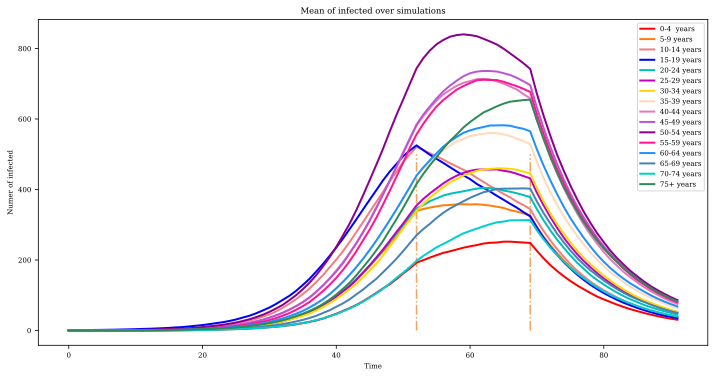

In [65]:
plt.figure(figsize = (12,6))
for i in range(16):
    plt.plot(t, meanI[:,i], lw = 2, label = 'mean I', color = colors[i]) 

    plt.title('Mean of infected over simulations')
plt.vlines(52, 0, 500, linestyles = 'dashdot', color = 'sandybrown')
plt.vlines(69, 0, 500, linestyles = 'dashdot', color = 'sandybrown')
plt.legend(pavia['Age group'])
plt.xlabel('Time')
plt.ylabel('Numer of infected')
plt.show()